In [ ]:
# please make sure you are connected with GPU
# Edit -> Notebook Settings -> Hardware accelerator {set to GPU}
# This demo-code is not compatible with CPU

In [1]:
%%bash
# Colab-specific setup
!(stat -t /usr/local/lib/*/dist-packages/google/colab > /dev/null 2>&1) && exit 
pip install yacs 2>> install.log
git init 2>> install.log
git remote add origin https://bitbucket.csiro.au/scm/~hab029/realsenseobjectdepth.git
git pull origin master 2>> install.log
chmod +x demo_test.sh
./demo_test.sh 2>> install.log

Initialized empty Git repository in /content/.git/
[2020-09-11 06:15:38,770 INFO test.py line 172 156] Loaded configuration file config/ade20k-resnet50dilated-ppm_deepsup.yaml
[2020-09-11 06:15:38,770 INFO test.py line 173 156] Running with config:
DATASET:
  imgMaxSize: 1000
  imgSizes: (300, 375, 450, 525, 600)
  list_train: ./data/training.odgt
  list_val: ./data/validation.odgt
  num_class: 150
  padding_constant: 8
  random_flip: True
  root_dataset: ./data/
  segm_downsampling_rate: 8
DIR: ckpt/ade20k-resnet50dilated-ppm_deepsup
MODEL:
  arch_decoder: ppm_deepsup
  arch_encoder: resnet50dilated
  fc_dim: 2048
  weights_decoder: 
  weights_encoder: 
TEST:
  batch_size: 1
  checkpoint: epoch_20.pth
  result: ./
TRAIN:
  batch_size_per_gpu: 2
  beta1: 0.9
  deep_sup_scale: 0.4
  disp_iter: 20
  epoch_iters: 5000
  fix_bn: False
  lr_decoder: 0.02
  lr_encoder: 0.02
  lr_pow: 0.9
  num_epoch: 20
  optim: SGD
  seed: 304
  start_epoch: 0
  weight_decay: 0.0001
  workers: 16
VAL:
  bat

In [ ]:
from google.colab.patches import cv2_imshow
import os, csv, torch, numpy, scipy.io, PIL.Image, torchvision.transforms
# Our libs
from mit_semseg.models import ModelBuilder, SegmentationModule
from mit_semseg.utils import colorEncode

colors = scipy.io.loadmat('data/color150.mat')['colors']
names = {}
with open('data/object150_info.csv') as f:
    reader = csv.reader(f)
    next(reader)
    for row in reader:
        names[int(row[0])] = row[5].split(";")[0]



In [ ]:
def visualize_result(img, pred, index=None):
    # filter prediction class if requested
    if index is not None:
        pred = pred.copy()
        pred[pred != index] = -1
        print(f'{names[index+1]}:')
        
    # colorize prediction
    pred_color = colorEncode(pred, colors).astype(numpy.uint8)

    # aggregate images and save
    # im_vis = numpy.concatenate((img, pred_color), axis=1)
    # display(PIL.Image.fromarray(im_vis))
    
    im = numpy.concatenate((img, pred_color), axis=1)
    cv2_imshow(im)
    # cv2.waitKey(0)
    # cv2.destroyAllWindows()

In [ ]:
# Network Builders
net_encoder = ModelBuilder.build_encoder(
    arch='resnet50dilated',
    fc_dim=2048,
    weights='ckpt/ade20k-resnet50dilated-ppm_deepsup/encoder_epoch_20.pth')
net_decoder = ModelBuilder.build_decoder(
    arch='ppm_deepsup',
    fc_dim=2048,
    num_class=150,
    weights='ckpt/ade20k-resnet50dilated-ppm_deepsup/decoder_epoch_20.pth',
    use_softmax=True)

crit = torch.nn.NLLLoss(ignore_index=-1)
segmentation_module = SegmentationModule(net_encoder, net_decoder, crit)
segmentation_module.eval()
segmentation_module.cuda()

Loading weights for net_encoder
Loading weights for net_decoder


SegmentationModule(
  (encoder): ResnetDilated(
    (conv1): Conv2d(3, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn1): SynchronizedBatchNorm2d(64, eps=1e-05, momentum=0.001, affine=True, track_running_stats=True)
    (relu1): ReLU(inplace=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): SynchronizedBatchNorm2d(64, eps=1e-05, momentum=0.001, affine=True, track_running_stats=True)
    (relu2): ReLU(inplace=True)
    (conv3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn3): SynchronizedBatchNorm2d(128, eps=1e-05, momentum=0.001, affine=True, track_running_stats=True)
    (relu3): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(128, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): SynchronizedBatchNorm2d(64, eps=1

In [ ]:
# Load and normalize one image as a singleton tensor batch
pil_to_tensor = torchvision.transforms.Compose([
    torchvision.transforms.ToTensor(),
    torchvision.transforms.Normalize(
        mean=[0.485, 0.456, 0.406], # These are RGB mean+std values
        std=[0.229, 0.224, 0.225])  # across a large photo dataset.
])
pil_image = PIL.Image.open('ADE_val_00001519.jpg').convert('RGB')
img_original = numpy.array(pil_image)
img_data = pil_to_tensor(pil_image)
singleton_batch = {'img_data': img_data[None].cuda()}
output_size = img_data.shape[1:]

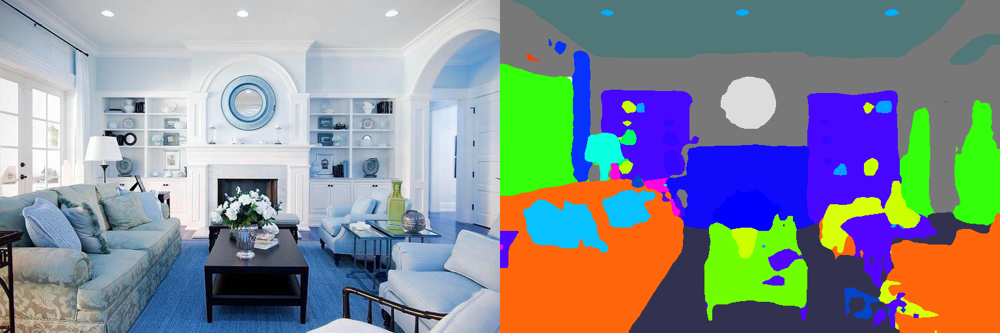

In [ ]:
# Run the segmentation at the highest resolution.
with torch.no_grad():
    scores = segmentation_module(singleton_batch, segSize=output_size)
    
# Get the predicted scores for each pixel
_, pred = torch.max(scores, dim=1)
pred = pred.cpu()[0].numpy()
visualize_result(img_original, pred)

wall:


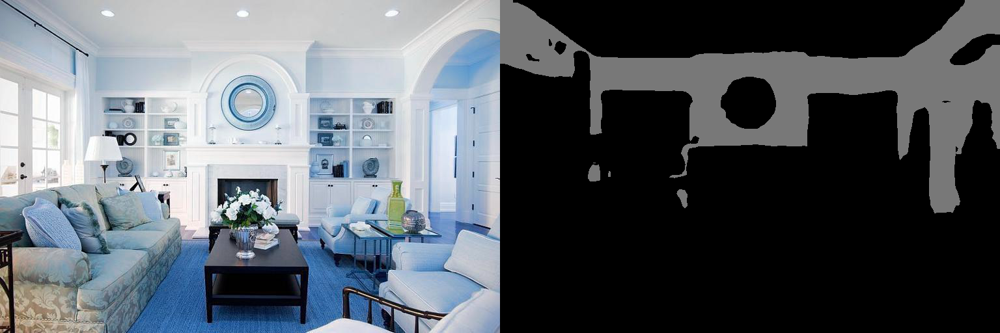

sofa:


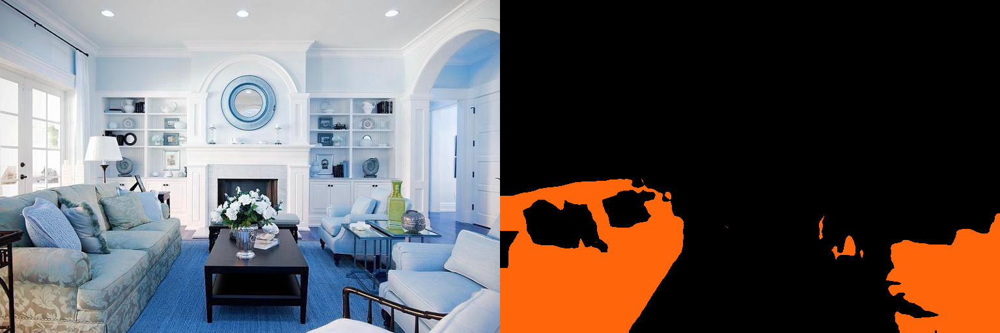

ceiling:


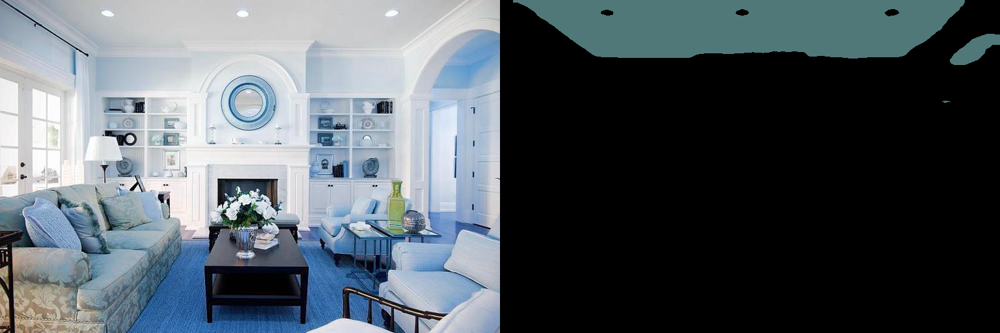

door:


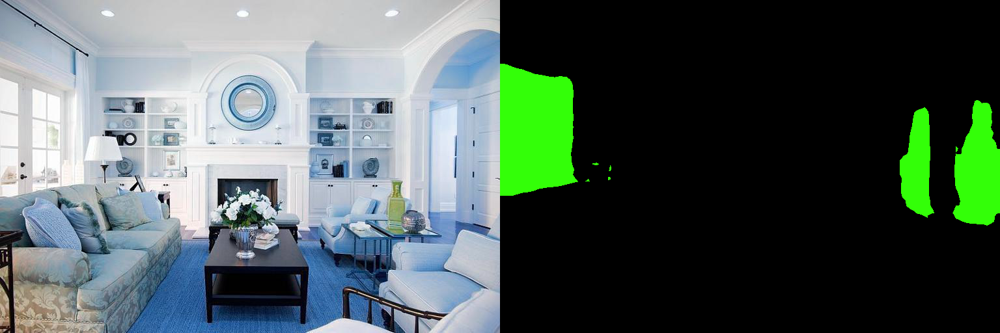

shelf:


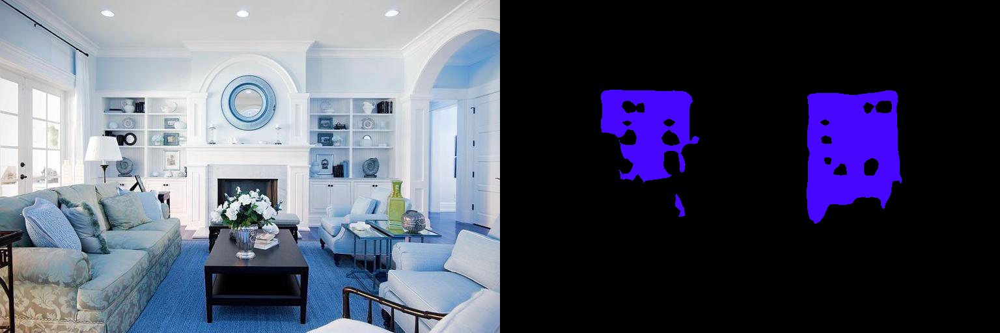

floor:


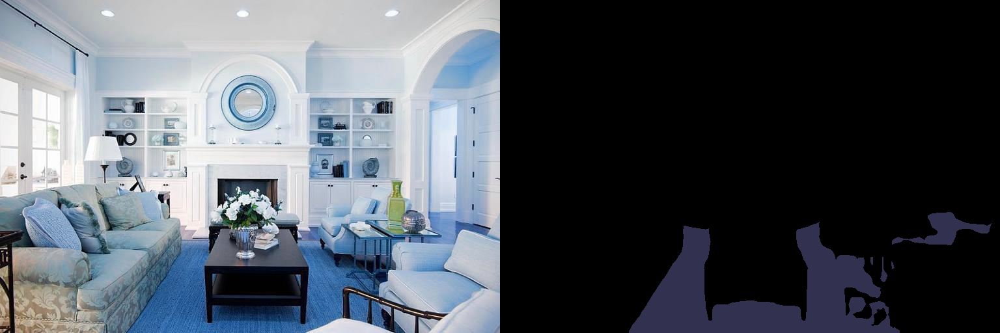

fireplace:


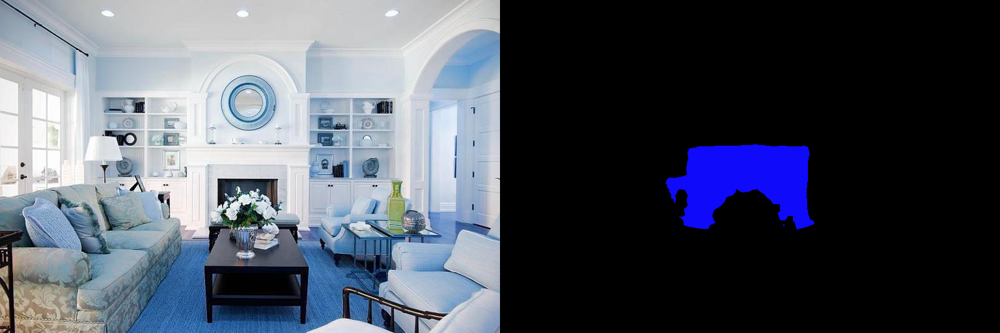

coffee:


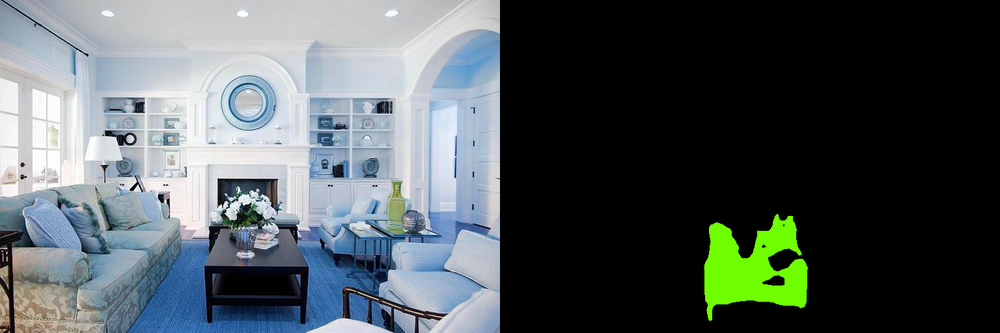

table:


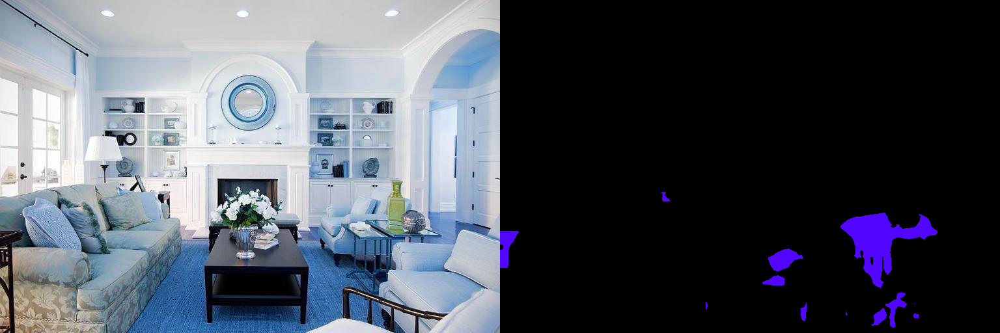

cushion:


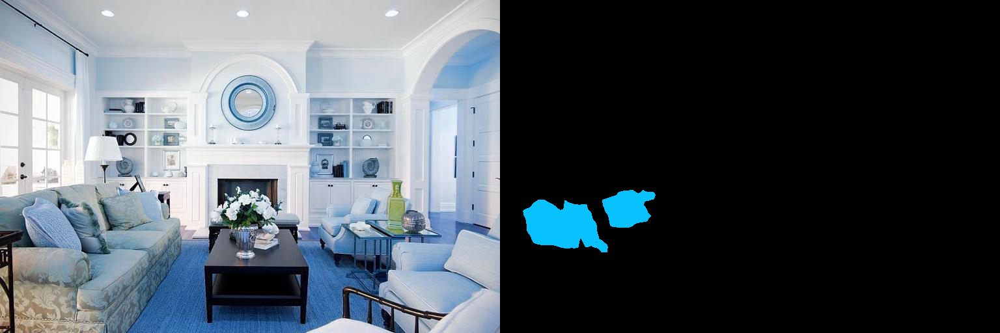

mirror:


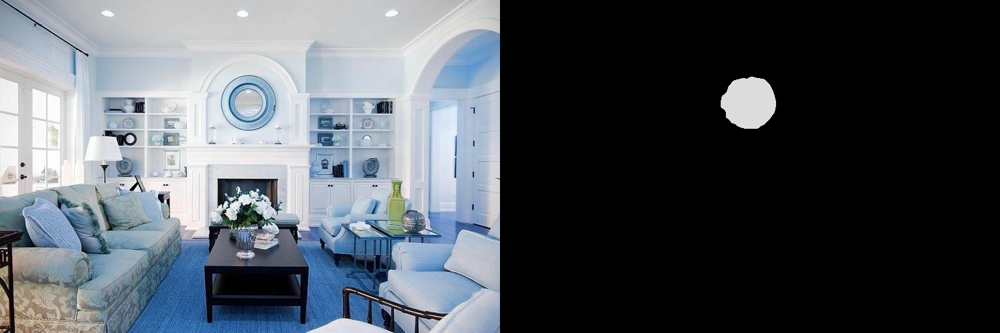

curtain:


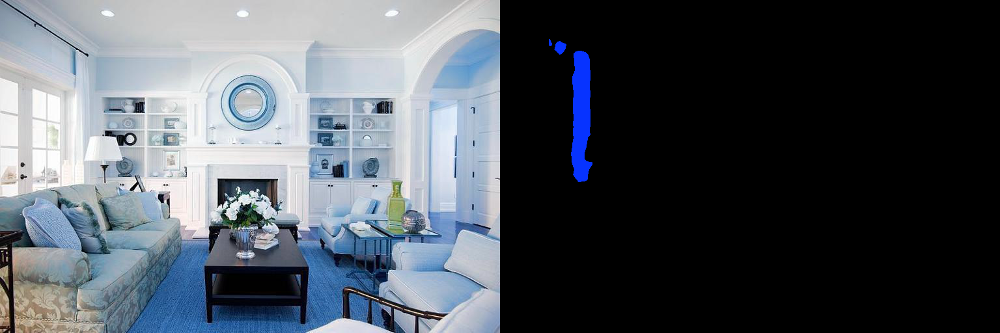

armchair:


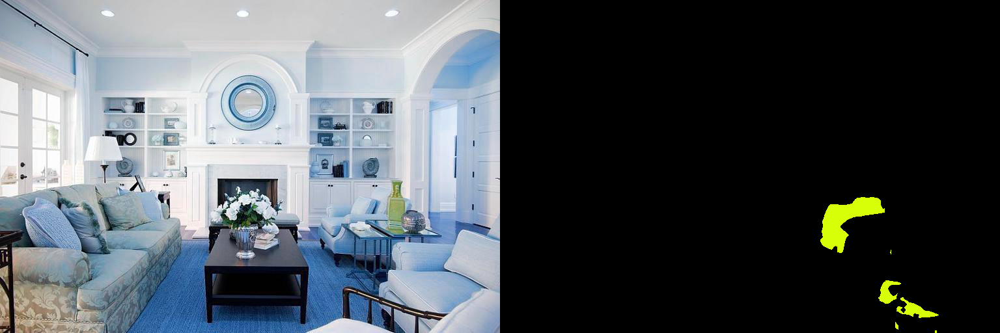

flower:


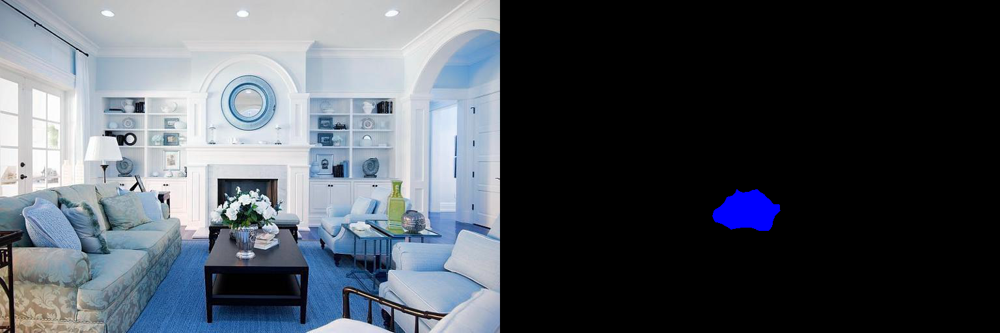

vase:


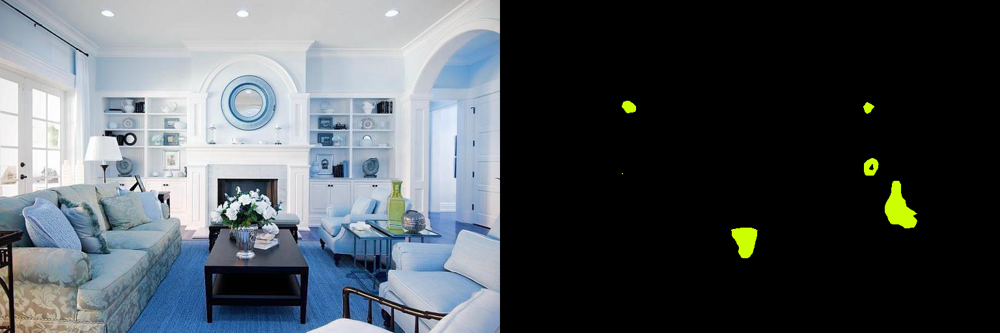

In [ ]:
# Top classes in answer
predicted_classes = numpy.bincount(pred.flatten()).argsort()[::-1]
for c in predicted_classes[:15]:
    visualize_result(img_original, pred, c)

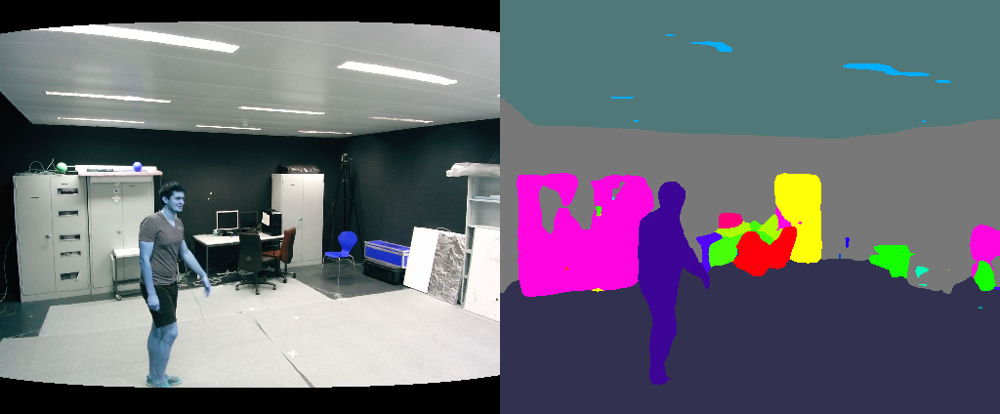

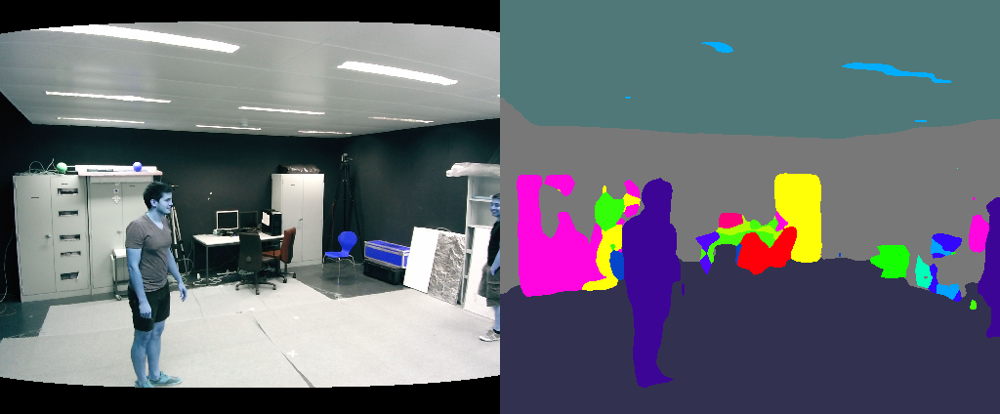

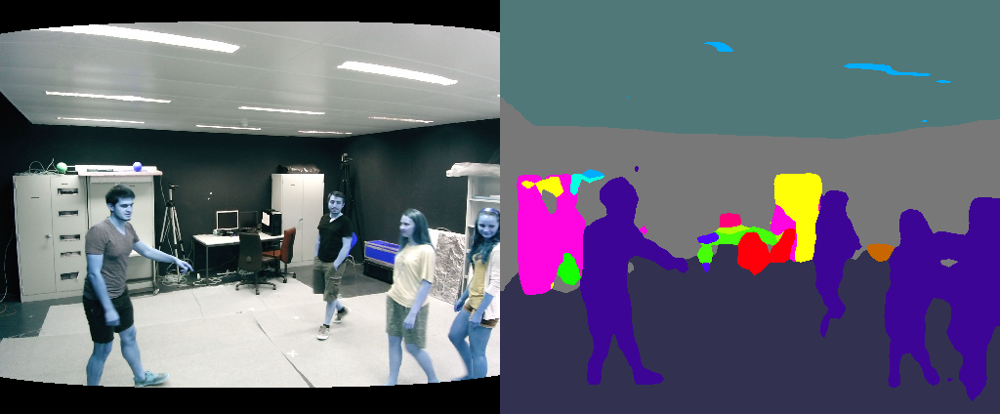

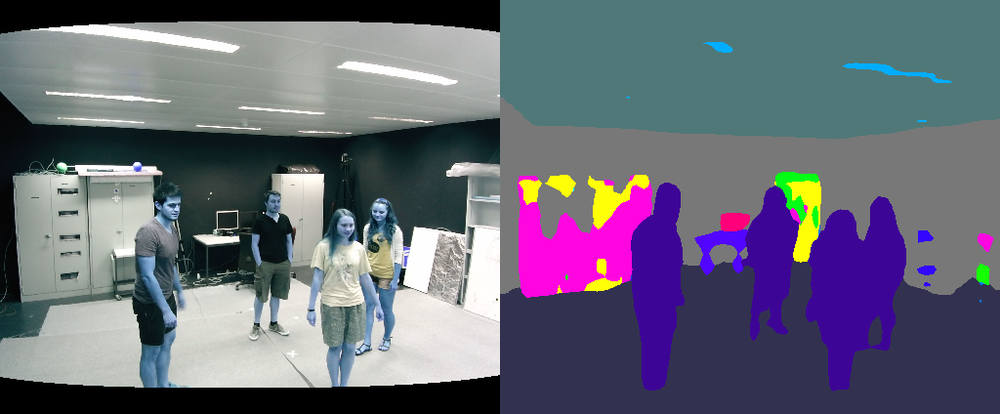

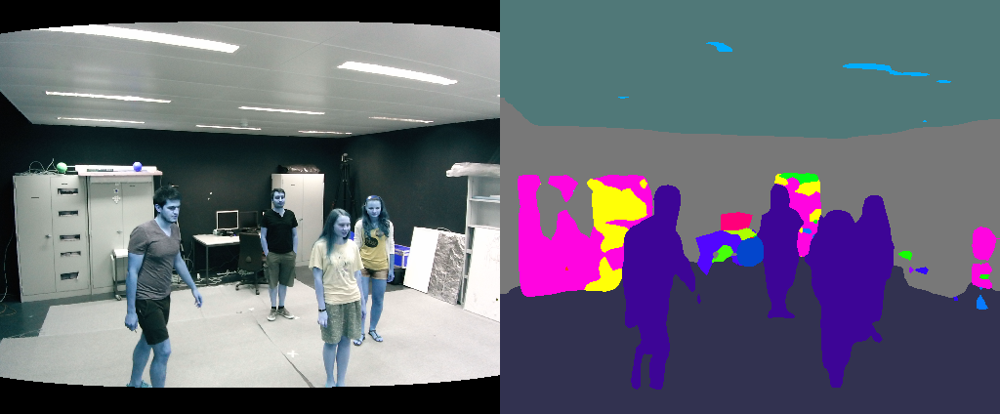

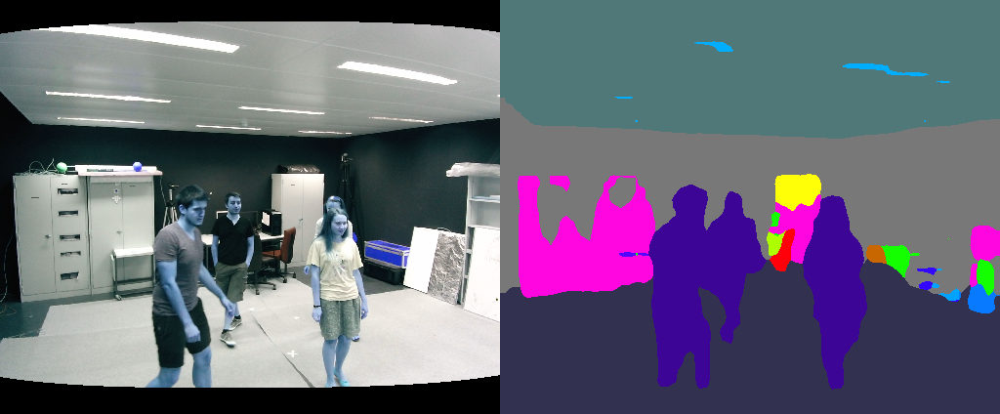

In [ ]:
# Run segmentation on multiple images
for i in range (200,420,40):
  pil_image = PIL.Image.open('rgb/rgb%d.png' % (i)).convert('RGB')
  img_original = numpy.array(pil_image)
  img_data = pil_to_tensor(pil_image)
  singleton_batch = {'img_data': img_data[None].cuda()}
  output_size = img_data.shape[1:]
  with torch.no_grad():
    scores = segmentation_module(singleton_batch, segSize=output_size)
  _, pred = torch.max(scores, dim=1)
  pred = pred.cpu()[0].numpy()
  visualize_result(img_original, pred)
  


person:


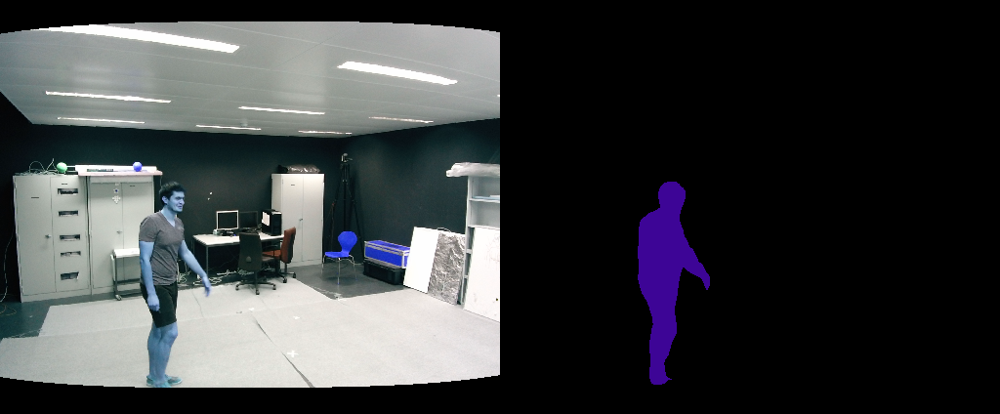

person:


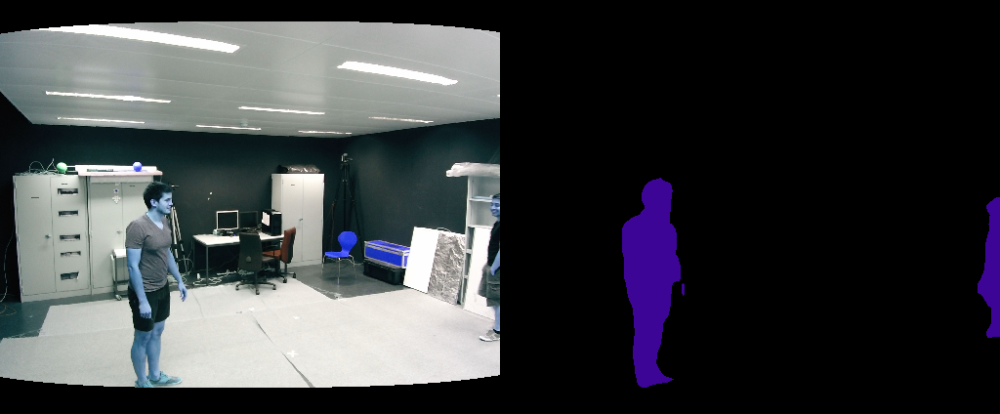

person:


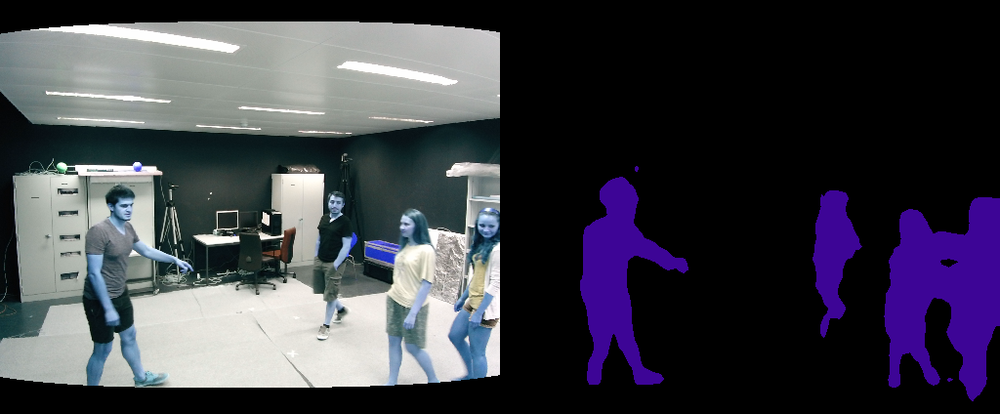

person:


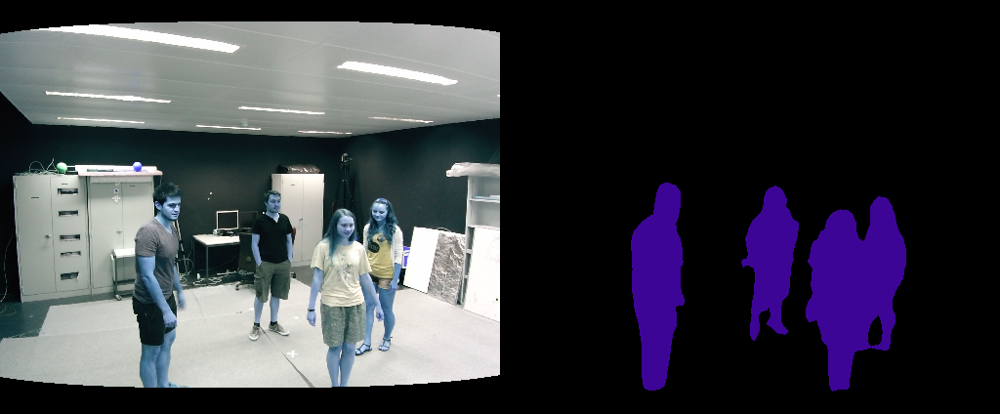

person:


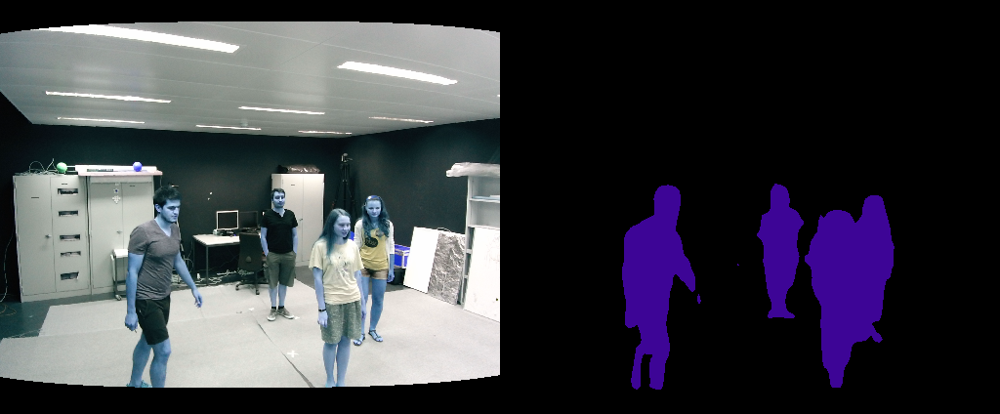

person:


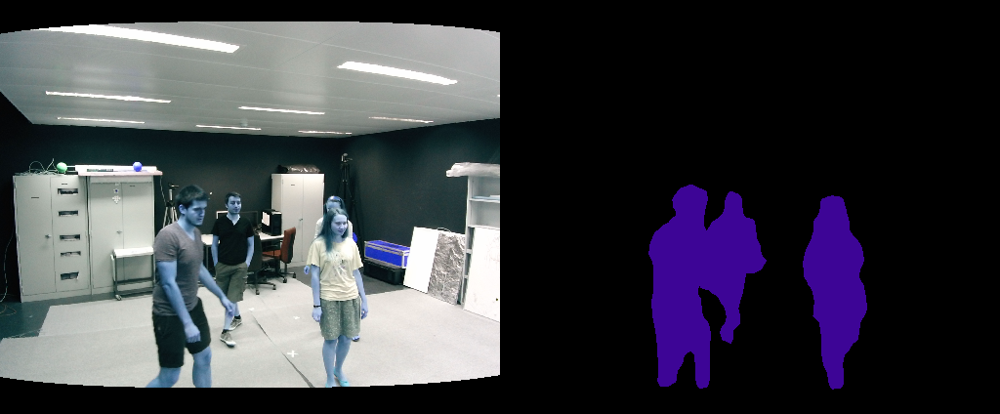

In [ ]:
# Run (only person) segmentation on multiple images
for i in range (200,420,40):
  pil_image = PIL.Image.open('rgb/rgb%d.png' % (i)).convert('RGB')
  img_original = numpy.array(pil_image)
  img_data = pil_to_tensor(pil_image)
  singleton_batch = {'img_data': img_data[None].cuda()}
  output_size = img_data.shape[1:]
  with torch.no_grad():
    scores = segmentation_module(singleton_batch, segSize=output_size)
  _, pred = torch.max(scores, dim=1)
  pred = pred.cpu()[0].numpy()
  # index = 12 corresponds to 'person'
  visualize_result(img_original, pred, 12)

In [ ]:
######### now we work on some rgb-d data

def visualize_result_depth(img, pred, depth, index=None):
    # filter prediction class if requested
    if index is not None:
        pred = pred.copy()
        depth = depth.copy()
        pred[pred != index] = -1
        depth[pred != index] = 0
        depth = numpy.average(depth)
        print(f'{names[index+1],depth}:')
        
    # colorize prediction
    pred_color = colorEncode(pred, colors).astype(numpy.uint8)

    # aggregate images and save
    # im_vis = numpy.concatenate((img, pred_color), axis=1)
    # display(PIL.Image.fromarray(im_vis))
    
    im = numpy.concatenate((img, pred_color), axis=1)
    cv2_imshow(im)
    # cv2.waitKey(0)
    # cv2.destroyAllWindows()

('floor', 687.5614220961085):


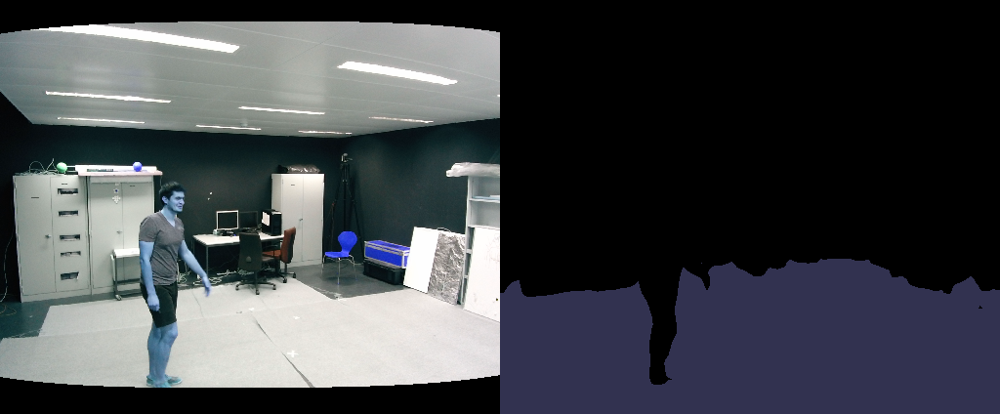

('ceiling', 728.2458450029482):


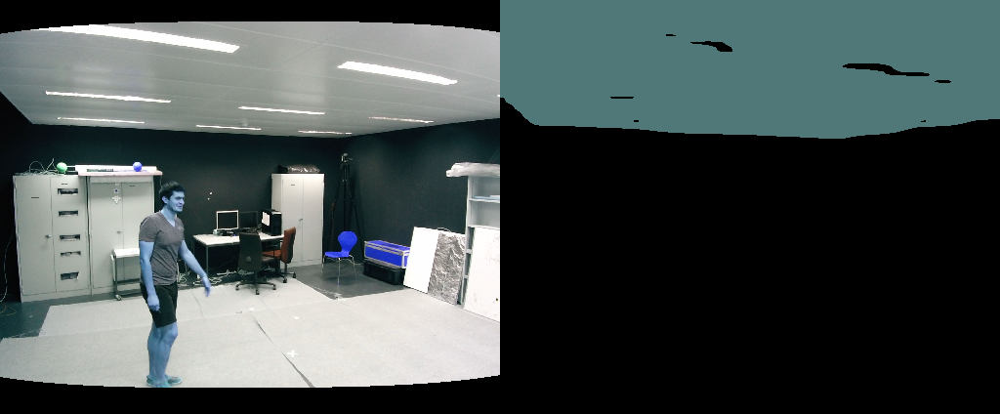

('wall', 205.2427402712264):


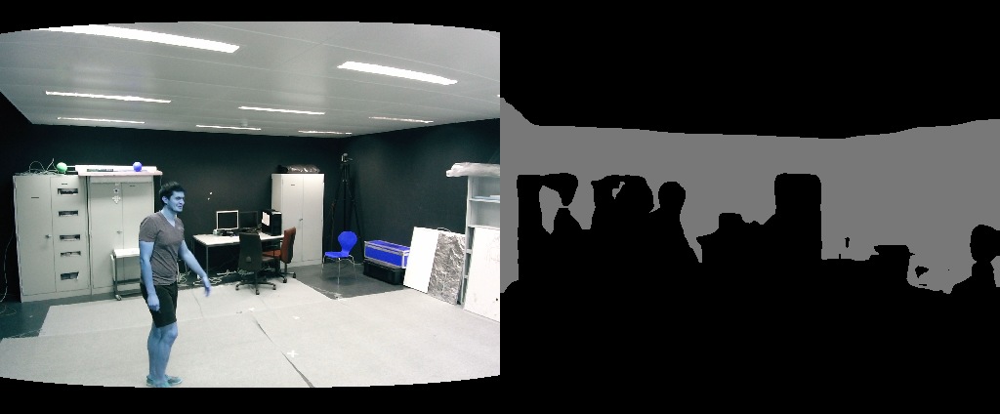

('cabinet', 343.1417720002948):


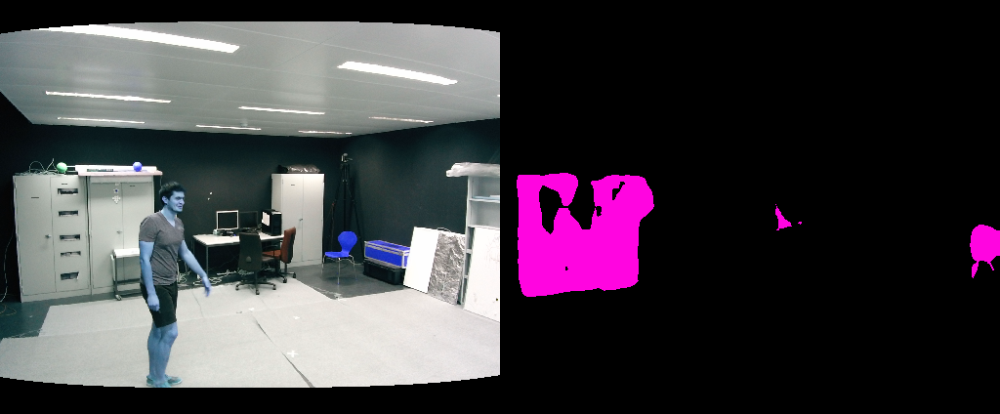

('person', 88.09219763413915):


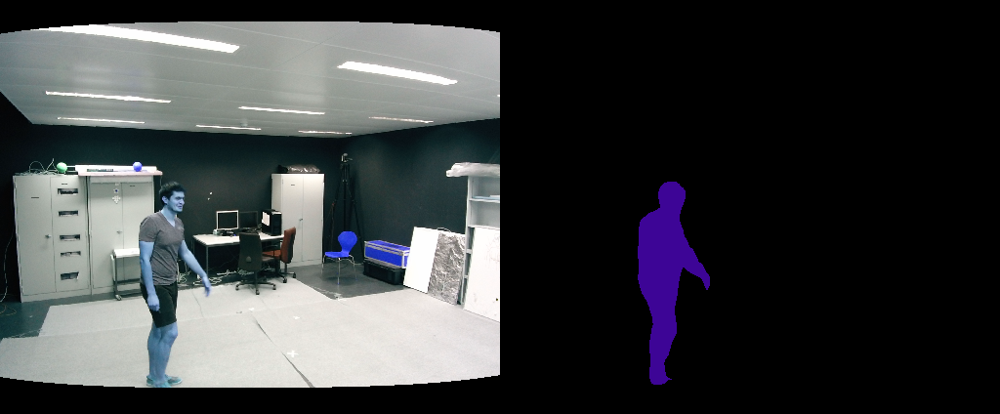

('wardrobe', 105.99361549233491):


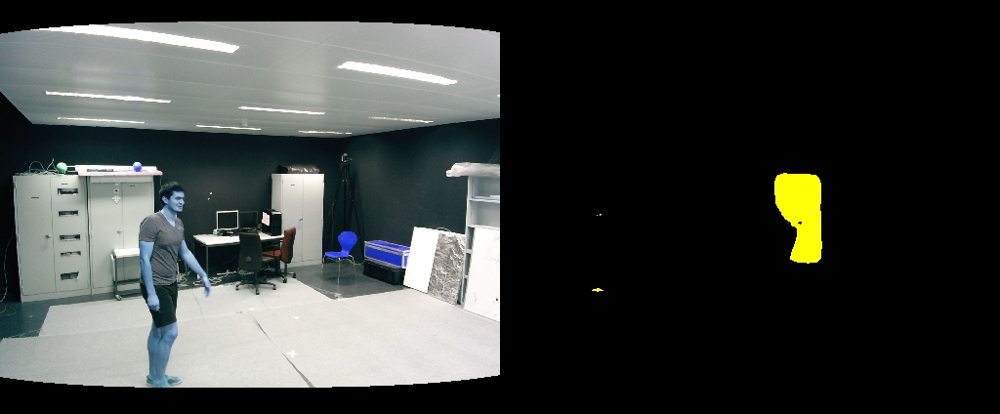

('swivel', 33.841654075766506):


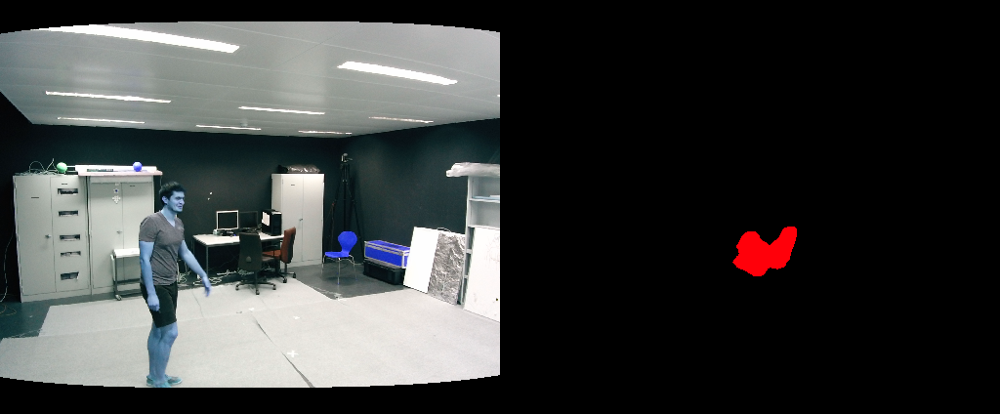

('box', 23.57272626768868):


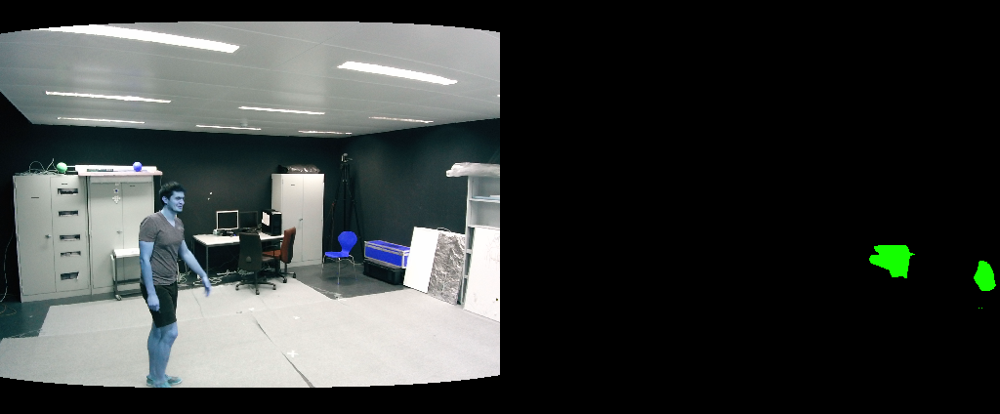

('desk', 3.7065245430424527):


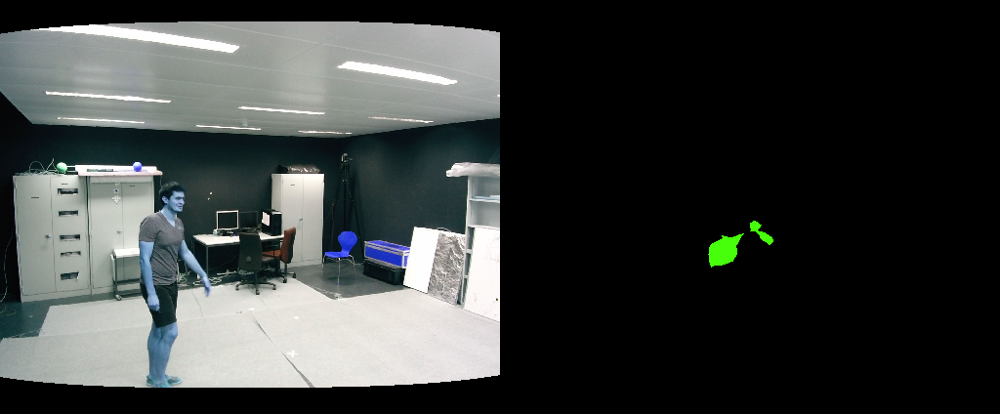

('light', 8.66956257370283):


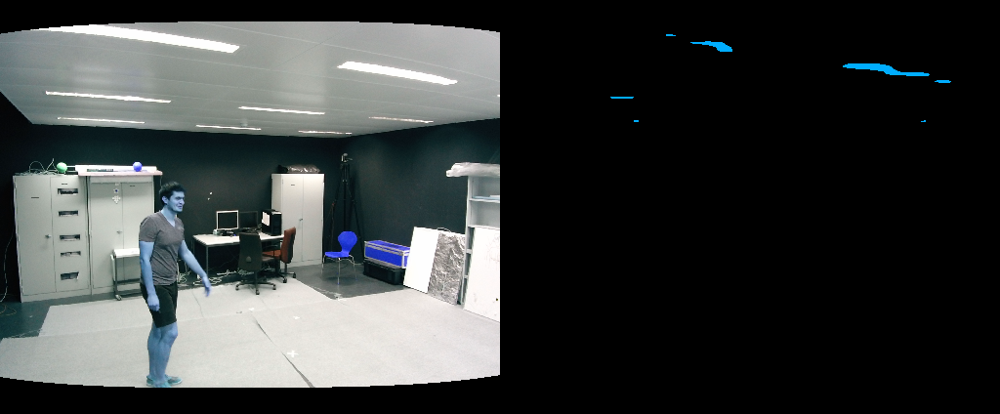

('computer', 2.8277196344339623):


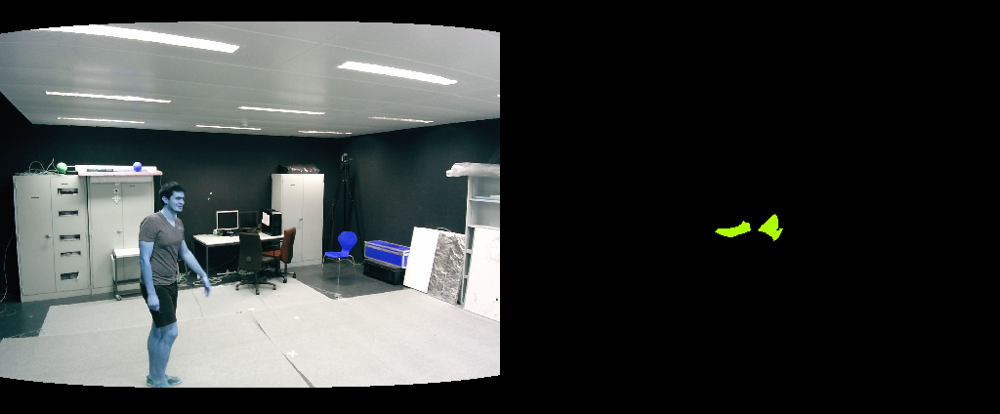

('table', 1.4494352520636793):


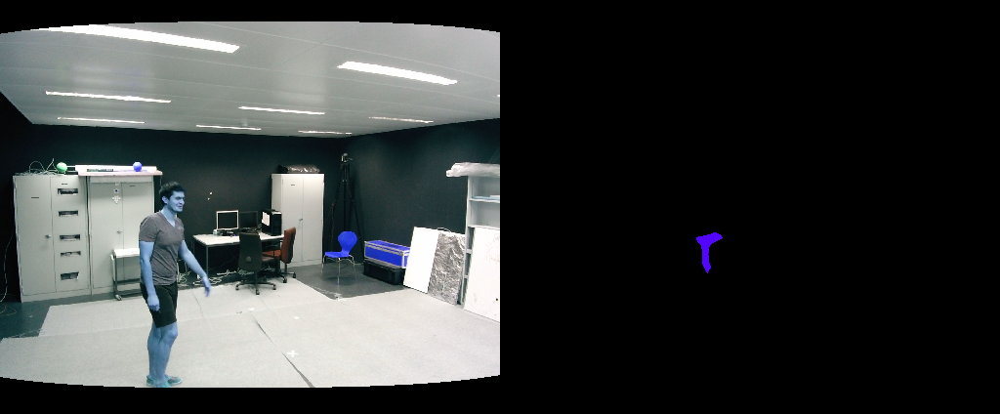

('crt', 0.5915250958136793):


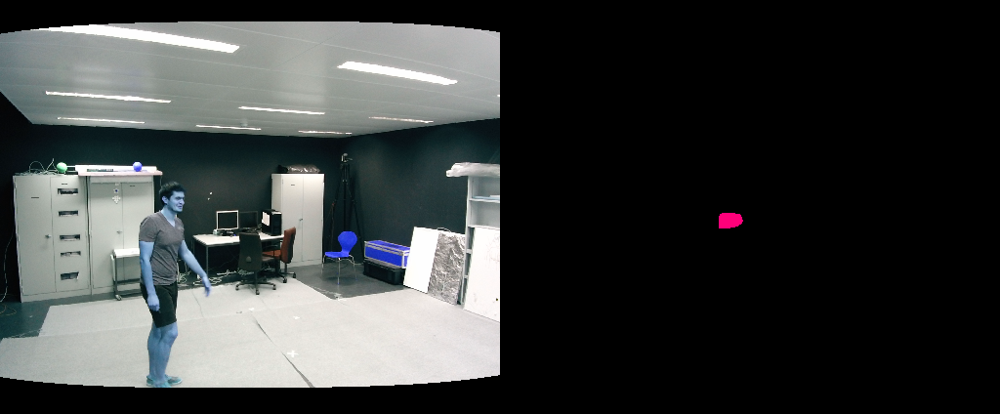

('bulletin', 2.9265274911556602):


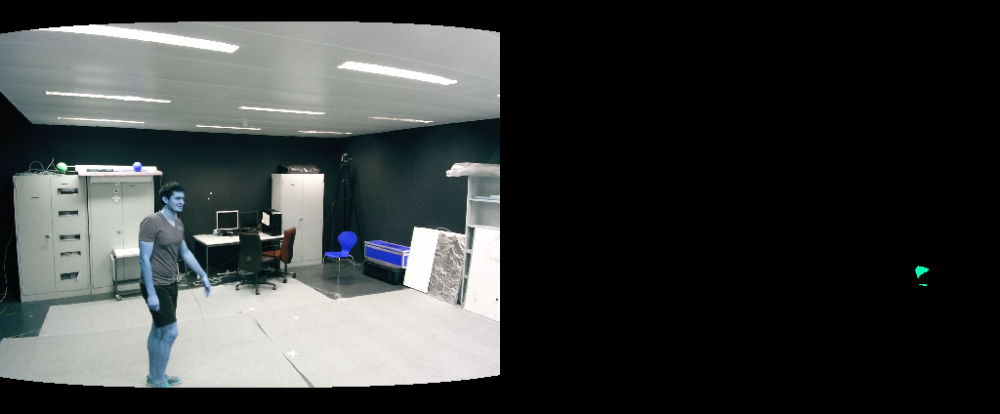

('door', 1.2010428950471699):


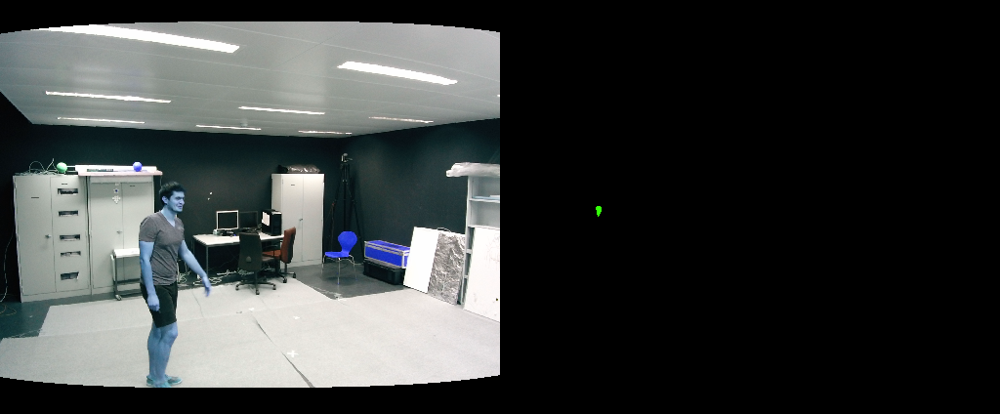

In [ ]:
# distance calculation of different objects in scene
pil_to_tensor = torchvision.transforms.Compose([
    torchvision.transforms.ToTensor(),
    torchvision.transforms.Normalize(
        mean=[0.485, 0.456, 0.406], # These are RGB mean+std values
        std=[0.229, 0.224, 0.225])  # across a large photo dataset.
])
pil_image = PIL.Image.open('rgb/rgb200.png').convert('RGB')
depth_map = numpy.array(PIL.Image.open('depth/depth200.png'))

img_original = numpy.array(pil_image)
img_data = pil_to_tensor(pil_image)
singleton_batch = {'img_data': img_data[None].cuda()}
output_size = img_data.shape[1:]
# Run the segmentation at the highest resolution.
with torch.no_grad():
    scores = segmentation_module(singleton_batch, segSize=output_size)
    
# Get the predicted scores for each pixel
_, pred = torch.max(scores, dim=1)
pred = pred.cpu()[0].numpy()
predicted_classes = numpy.bincount(pred.flatten()).argsort()[::-1]
for c in predicted_classes[:15]:
    visualize_result_depth(img_original, pred, depth_map, c)